In [1]:
%pwd

'/home/xupb/scRNA_data/mouse_pfc/manuscripts/scanpy'

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import loompy
#print(loompy.__version__)
import os
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline


/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.3 umap==0.3.10 numpy==1.17.0 scipy==1.4.1 pandas==0.23.4 scikit-learn==0.23.1 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


In [65]:
sc.settings.set_figure_params(dpi=80, frameon=False,fontsize=10,dpi_save=300,format='pdf')  # low dpi (dots per inch) yields small inline figures
plt.rcParams['font.sans-serif']=['Arial']
plt.rcParams['pdf.fonttype'] = 'truetype'

In [ ]:
# PART 1

# Subset excitatory neuron

In [87]:
adata=sc.read_h5ad( './write/pfc_seurat_merge_anno.h5ad')

In [92]:
# how many cells are from FACSorting
adata.obs['facs'].value_counts()

unsort    19470
sort       1791
Name: facs, dtype: int64

In [ ]:
### subset excitatory neuron
bdata = adata[adata.obs['louvain_coarse'].isin(['Excitatory'])].copy()
bdata

In [ ]:
sc.pp.filter_genes(bdata, min_cells=3)

In [9]:
# export meta info and filtered genes for seurat processing
bdata.obs.to_csv('sub_exn_meta.csv')
bdata.var.to_csv('sub_exn_vars.csv')

# Processing in Seurat

In [ ]:
#See R scripts, 
### step 3 ###
### 3_filtering_in_seurat
### Analysis on Excitatory neuron  ###

In [ ]:
# PART2 3-6

# Import loom file processed by Seurat

In [41]:
## read loom file for first time, next time, load h5ad file

#bdata=sc.read_loom('/home/xupb/scRNA_data/mouse_pfc/manuscripts/pfc_exn_sub.loom')


/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/loompy/loom_layer.py:123: RuntimeWarning: invalid value encountered in not_equal
  nonzeros = np.where(vals != 0)


In [42]:
bdata

AnnData object with n_obs × n_vars = 10005 × 19605 
    obs: 'ClusterID', 'ClusterName', 'G2M_Score', 'Phase', 'S_Score', 'facs', 'nCount_RNA', 'nFeature_RNA', 'old_ident', 'orig_ident', 'percent_mt', 'percent_rp', 'sample'
    var: 'Selected', 'vst_mean', 'vst_variable', 'vst_variance', 'vst_variance_expected', 'vst_variance_standardized'
    obsm: 'pca_cell_embeddings', 'tsne_cell_embeddings', 'umap_cell_embeddings'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'

In [43]:
bdata.obsm['X_pca']=bdata.obsm['pca_cell_embeddings']

In [44]:
bdata.var['highly_variable']=bdata.var['Selected'].astype('bool')

In [45]:
results_file = './write/pfc_sub_seu.h5ad'
bdata.write(results_file) 

... storing 'ClusterName' as categorical
... storing 'Phase' as categorical
... storing 'facs' as categorical
... storing 'old_ident' as categorical
... storing 'orig_ident' as categorical
... storing 'sample' as categorical


In [46]:
sc.pp.neighbors(bdata, n_neighbors=15, n_pcs=30)
sc.tl.umap(bdata)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP


/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [50]:
sc.tl.leiden(bdata,resolution =0.3)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [46]:
#sc.tl.tsne(bdata, n_pcs=50)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:04)


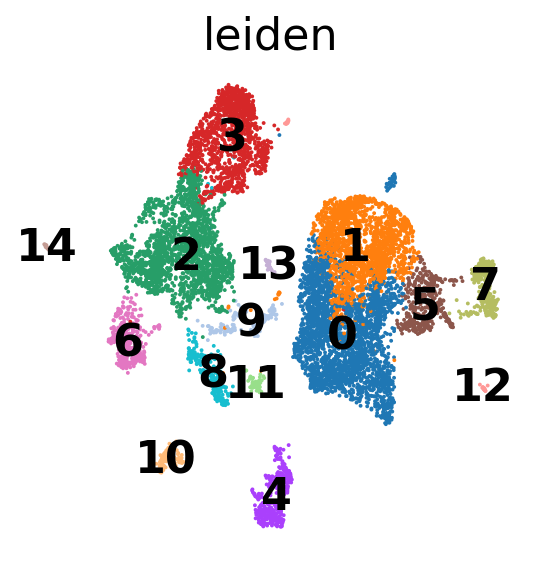

In [51]:
sc.pl.umap(bdata, color=['leiden'],
           use_raw=False,ncols=3,layer='norm_data',legend_loc='on data')

# check which cluster has low nCount_RNA, low nFeature_RNA and high MT percent

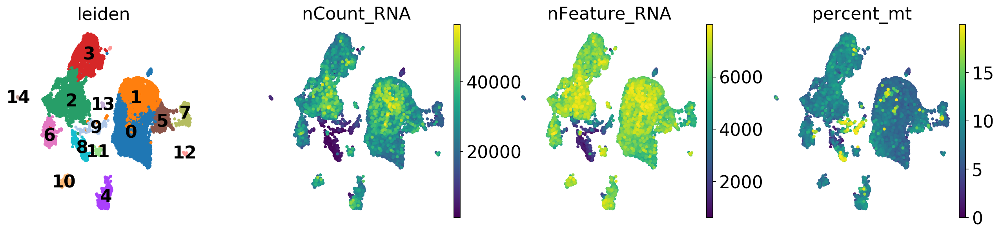

In [52]:
sc.pl.umap(bdata, color=['leiden','nCount_RNA', 'nFeature_RNA', 'percent_mt'],
           size=50,#L6
           use_raw=False,ncols=4,layer='norm_data',legend_loc='on data')#,save=' which cluster lowQ.png'

# Find DEGs for each cluster, do metascape analysis to determine which cluster is not excitatory neuron cluster

In [56]:
sc.tl.rank_genes_groups(bdata, 'leiden', method='wilcoxon',layer='norm_data',use_raw=False,n_genes=200)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:22)


In [54]:
pd.options.display.max_columns = None
# display max_columns setting
pd.DataFrame(bdata.uns['rank_genes_groups']['names']).head(50)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,Pcp4,Ndn,Mef2c,C1ql3,Pex5l,Nap1l5,Calb1,Tshz2,Gm42418,Gria2,C1qb,Olig1,Car2,Ly6a,Reln
1,3110035E14Rik,Ubb,Epha4,Rasl10a,Pou3f1,Slc1a2,Fkbp1a,Lypd1,Actb,Snhg11,C1qa,Olig2,Apoe,Flt1,Ndnf
2,Ttc9b,Uchl1,Nrn1,Enc1,Rab3c,Rcan2,Nectin3,Cbln2,Calm2,Malat1,C1qc,Ptprz1,Dbi,Cldn5,Cacna2d2
3,Garnl3,Tuba1a,Nrsn1,Dgkb,Bcl11b,Serpini1,Gabra2,Myl4,Ubb,Ttc14,Cst3,C1ql1,Qk,Pltp,Ramp1
4,Rprm,Hsp90ab1,Atp1b2,Galnt14,Lamp5,Nxph3,Bhlhe22,Etv1,Ckb,Ptprd,Trem2,S100a16,Zbtb20,Klf2,H3f3b
5,Tle4,Gapdh,Cnr1,Tesc,Ppfia2,Elavl2,Cux2,Htr2c,Ppia,Kcnq1ot1,Selenop,Bcan,Csrp1,Ly6c1,Msi2
6,Trbc2,Slc25a4,Fat3,Nptxr,Gabra2,Etl4,Alcam,Il11ra1,Uchl1,Meg3,Hexb,S100a1,Cmtm5,Itm2a,Rpl13
7,Rnf152,Hsp90aa1,Lmo4,Cck,Ntng1,Pak1,2900055J20Rik,Neto2,Stmn1,mt-Co2,Csf1r,Gpr37l1,Tsc22d4,Bsg,Rps14
8,Rph3a,Mdh1,Vstm2l,Tsc22d1,Dner,Ncam1,Camk2n1,Nrsn2,Slc25a4,Nktr,Ctss,Pdgfra,S100a16,Slc2a1,Rps3
9,Efhd2,Slc25a3,Kcnq3,Nell2,Igfbp4,Rab3b,Itpka,Efr3a,Tmsb4x,mt-Atp6,Tyrobp,Apoe,Myo6,Hspb1,Rps19


In [57]:
pd.DataFrame(bdata.uns['rank_genes_groups']['names']).to_csv('rank_genes_groups_wilcoxon_pfc_subexn_leiden0.3_pc30.csv')

In [58]:
results_file = './write/pfc_sub_seu_unfilter.h5ad'
bdata.write(results_file) 

In [5]:
bdata=sc.read_h5ad( './write/pfc_sub_seu_unfilter.h5ad')

# Filter out lowQ and contamination cell cluster

In [59]:
bdata = bdata[bdata.obs['leiden'].isin(['0', '1', '2', '3', '4', '5', '6','7'])].copy()
bdata

AnnData object with n_obs × n_vars = 9368 × 19605 
    obs: 'ClusterID', 'ClusterName', 'G2M_Score', 'Phase', 'S_Score', 'facs', 'nCount_RNA', 'nFeature_RNA', 'old_ident', 'orig_ident', 'percent_mt', 'percent_rp', 'sample', 'leiden'
    var: 'Selected', 'vst_mean', 'vst_variable', 'vst_variance', 'vst_variance_expected', 'vst_variance_standardized', 'highly_variable'
    uns: 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'pca_cell_embeddings', 'tsne_cell_embeddings', 'umap_cell_embeddings', 'X_pca', 'X_umap'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'

In [62]:
sc.pp.filter_genes(bdata, min_cells=3)

filtered out 211 genes that are detected in less than 3 cells


In [63]:
bdata.obs.to_csv('sub_exn_meta_filter_others.csv')

In [64]:
bdata.var.to_csv('sub_exn_vars_filter_others.csv')

In [65]:
bdata

AnnData object with n_obs × n_vars = 9368 × 19394 
    obs: 'ClusterID', 'ClusterName', 'G2M_Score', 'Phase', 'S_Score', 'facs', 'nCount_RNA', 'nFeature_RNA', 'old_ident', 'orig_ident', 'percent_mt', 'percent_rp', 'sample', 'leiden'
    var: 'Selected', 'vst_mean', 'vst_variable', 'vst_variance', 'vst_variance_expected', 'vst_variance_standardized', 'highly_variable', 'n_cells'
    uns: 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'pca_cell_embeddings', 'tsne_cell_embeddings', 'umap_cell_embeddings', 'X_pca', 'X_umap'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'

# Processing in Seurat

In [ ]:
## see R scripts 
### step 5 ###
##############################


In [ ]:
# PART3 8-10

# Import file processed by Seurat

In [72]:
## read loom file for first time, next time, load h5ad file

# bdata=sc.read_loom('/home/xupb/scRNA_data/mouse_pfc/manuscripts/pfc_exn_sub_tirm.loom')

/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/loompy/loom_layer.py:123: RuntimeWarning: invalid value encountered in not_equal
  nonzeros = np.where(vals != 0)


In [74]:
bdata

AnnData object with n_obs × n_vars = 9368 × 19394 
    obs: 'ClusterID', 'ClusterName', 'G2M_Score', 'Phase', 'S_Score', 'facs', 'nCount_RNA', 'nFeature_RNA', 'old_ident', 'orig_ident', 'percent_mt', 'percent_rp', 'sample'
    var: 'Selected', 'vst_mean', 'vst_variable', 'vst_variance', 'vst_variance_expected', 'vst_variance_standardized'
    obsm: 'pca_cell_embeddings', 'tsne_cell_embeddings', 'umap_cell_embeddings'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'

In [83]:
bdata.obsm['X_pca']=bdata.obsm['pca_cell_embeddings']

In [84]:
bdata.var['highly_variable']=bdata.var['Selected'].astype('bool')

In [86]:
results_file = './write/pfc_sub_seu_trim.h5ad'
bdata.write(results_file) 

In [5]:
bdata=sc.read_h5ad('./write/pfc_sub_seu_trim.h5ad')

In [6]:
bdata

AnnData object with n_obs × n_vars = 9368 × 19394
    obs: 'ClusterID', 'ClusterName', 'G2M_Score', 'Phase', 'S_Score', 'facs', 'nCount_RNA', 'nFeature_RNA', 'old_ident', 'orig_ident', 'percent_mt', 'percent_rp', 'sample'
    var: 'Selected', 'vst_mean', 'vst_variable', 'vst_variance', 'vst_variance_expected', 'vst_variance_standardized', 'highly_variable'
    obsm: 'X_pca', 'pca_cell_embeddings', 'tsne_cell_embeddings', 'umap_cell_embeddings'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'

In [245]:
sc.pp.neighbors(bdata, n_neighbors=10, n_pcs=30)
sc.tl.umap(bdata)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [246]:
sc.tl.leiden(bdata,resolution =0.3)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


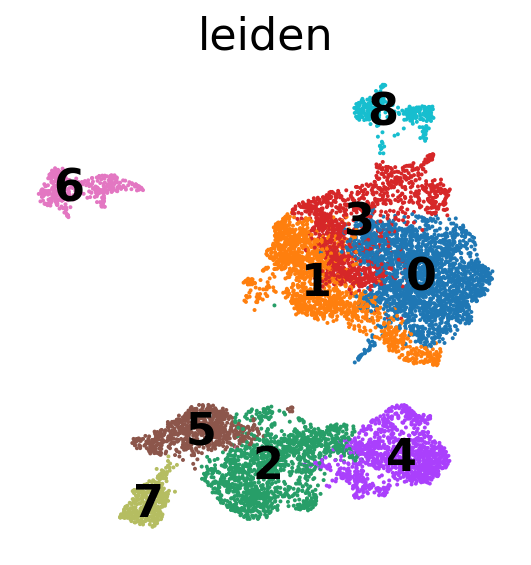

In [247]:
sc.pl.umap(bdata, color=['leiden'],use_raw=False,ncols=3,
           layer='norm_data',legend_loc='on data')

In [105]:
sc.tl.tsne(bdata, n_pcs=30)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:59)


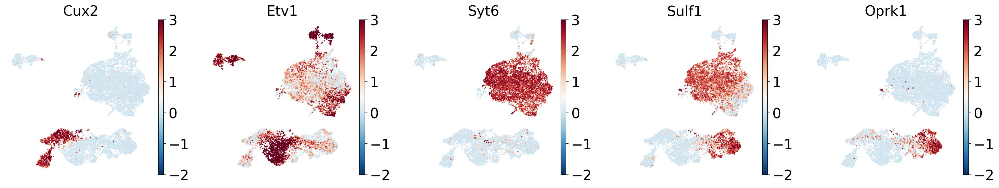

In [158]:
#check layer markers 
sc.pl.umap(bdata, color=["Cux2",#L2/3 c5 8
                         'Etv1',#L5, c3 7 9
                         "Syt6",'Sulf1',#L6, c0 1 4 6
                         'Oprk1',#L6, c2
                       ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

In [110]:
#### merge clusters, corase clustering by layer, this annotation defines 2 layer 6 clusters
bdata.obs['layer'] = bdata.obs['leiden']
old_to_new = {'0':'L6-Syt6','1':'L6-Syt6','3':'L6-Syt6',
              '4': 'L6-Oprk1',
              '5':'L2/3-Cux2','7':'L2/3-Cux2',
              '2':'L5-Etv1', '6':'L5-Etv1','8':'L5-Etv1'}
    
bdata.obs['layer'] = (
    bdata.obs['layer']
    .map(old_to_new)
    .astype('category')
)

In [159]:
#### merge clusters, corase clustering by layer, this annotation combines 2 layer 6 clusters into 1
bdata.obs['layer_v1'] = bdata.obs['leiden']
old_to_new = {'0':'L6-Sulf1','1':'L6-Sulf1','3':'L6-Sulf1',
              '4': 'L6-Sulf1',
              '5':'L2/3-Cux2','7':'L2/3-Cux2',
              '2':'L5-Etv1', '6':'L5-Etv1','8':'L5-Etv1'}
    
bdata.obs['layer_v1'] = (
    bdata.obs['layer_v1']
    .map(old_to_new)
    .astype('category')
)

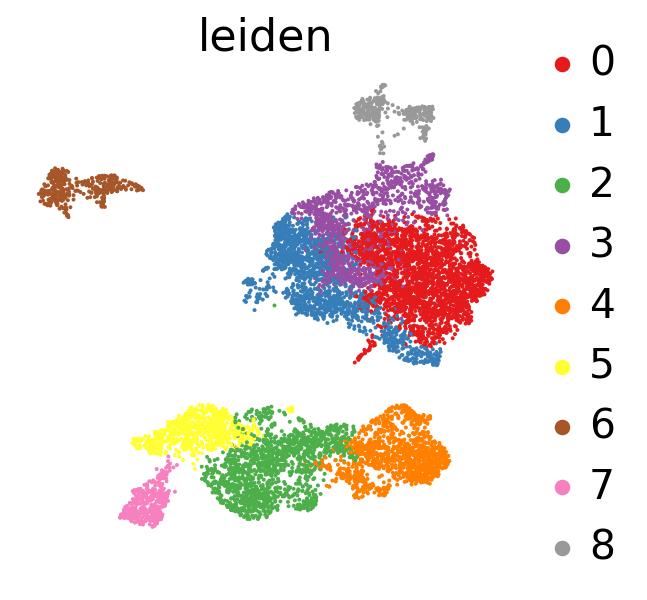

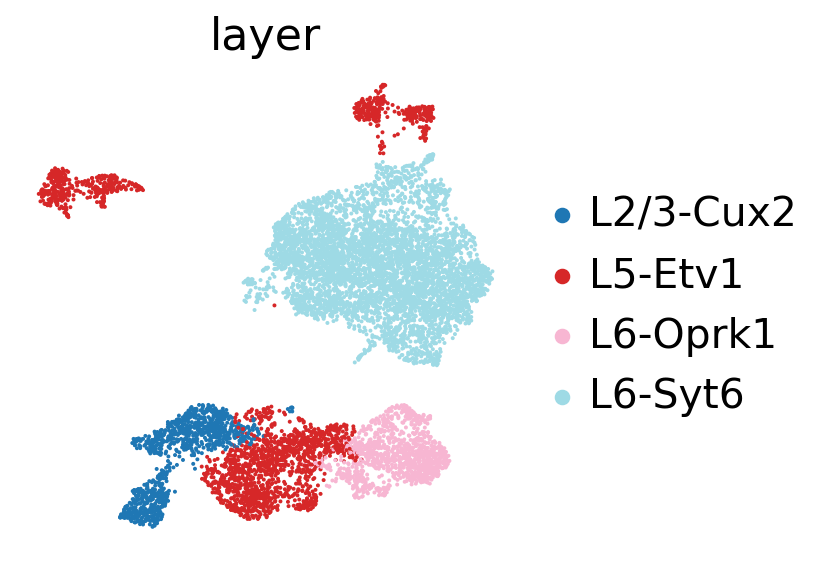

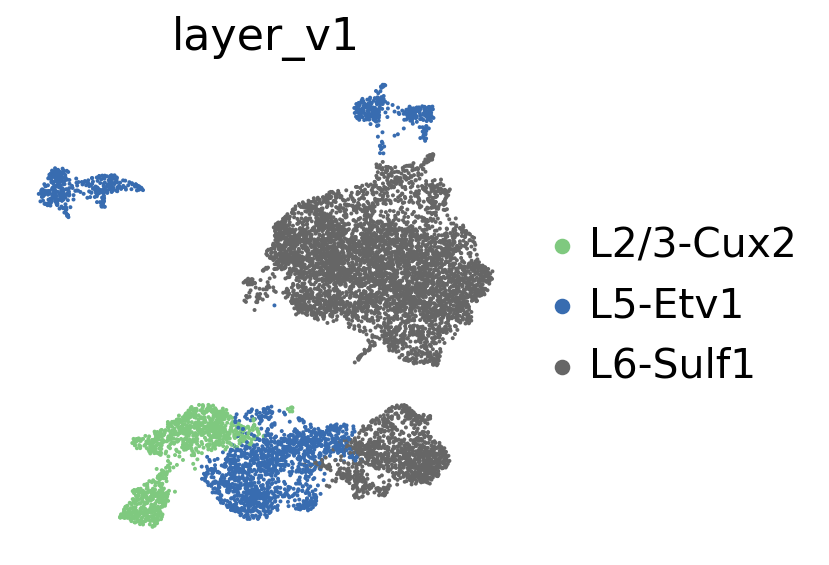

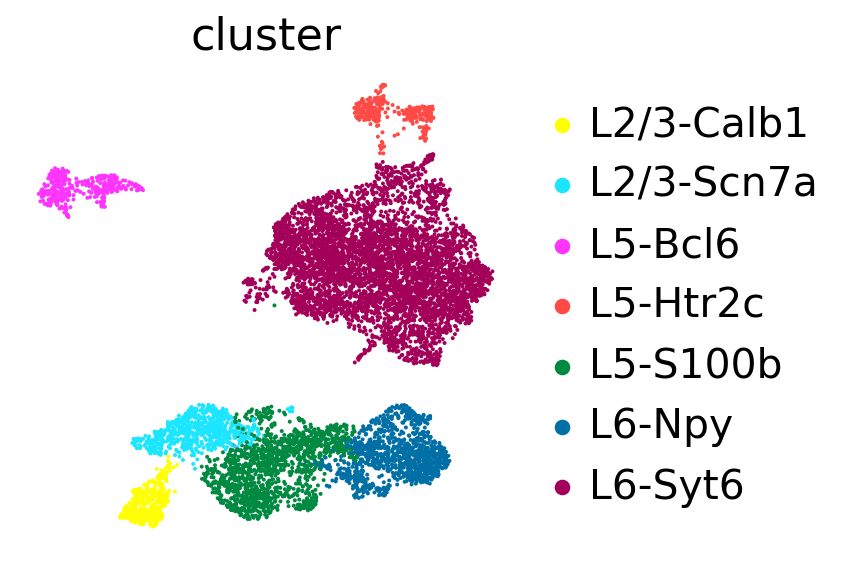

In [325]:
## check different color palletes
sc.pl.umap(bdata, color=['leiden'],use_raw=False,ncols=3,
           layer='norm_data',palette='Set1',legend_loc='right margin')
sc.pl.umap(bdata, color=['layer'],use_raw=False,ncols=3,
           layer='norm_data',palette='tab20',legend_loc='right margin')
sc.pl.umap(bdata, color=['layer_v1'],use_raw=False,ncols=3,
           layer='norm_data',palette='Accent',legend_loc='right margin')
sc.pl.umap(bdata, color=['cluster'],use_raw=False,ncols=3,
           layer='norm_data',palette=sc.pl.palettes.godsnot_102,legend_loc='right margin')


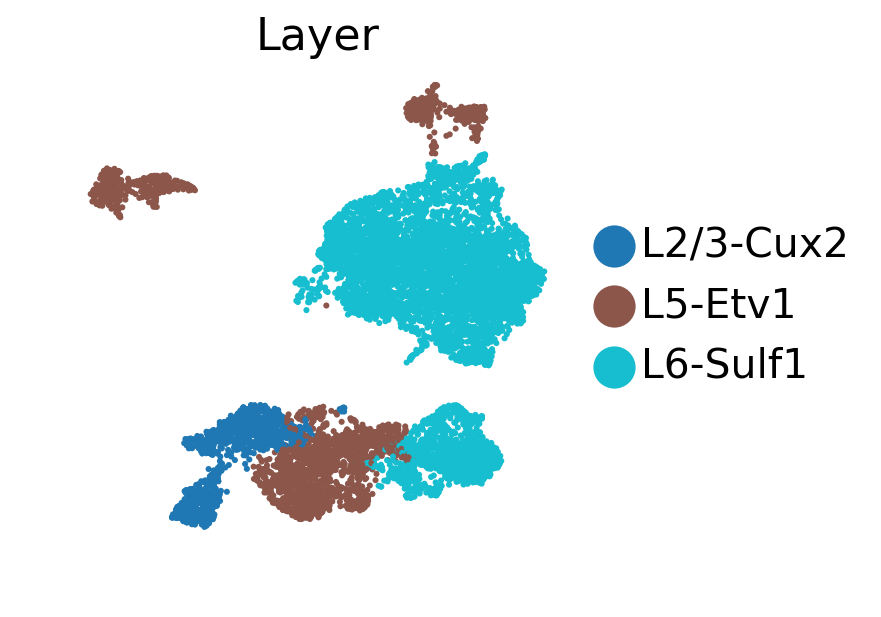

In [498]:
rcParams["legend.markerscale"] = 3.0
sc.pl.umap(bdata, color=['layer_v1'],use_raw=False,ncols=3,title='Layer',size=30,
           layer='norm_data',palette='tab10',legend_loc='right margin',save=' layer v1.pdf')

/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 0 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 1 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 2 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 3 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 4 missing from current font.
  s, flags=LOAD_NO_SC

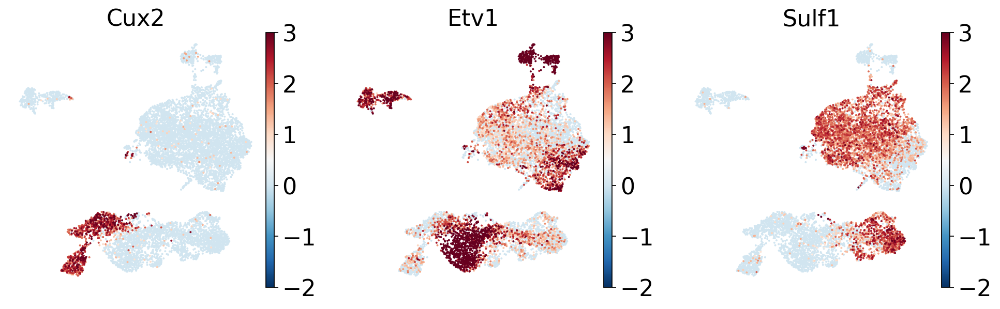

In [392]:
sc.pl.umap(bdata, color=["Cux2",#L2/3 c5 8
                         'Etv1',#L5, c3 7 9
                         'Sulf1',#L6, c0 1 4 6
                         #'Oprk1',#L6, c2
                         #"Syt6",
                       ],
           use_raw=False,ncols=3,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data',save=' layer genes.pdf')#

/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 0 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 1 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 2 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 3 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 4 missing from current font.
  s, flags=LOAD_NO_SC

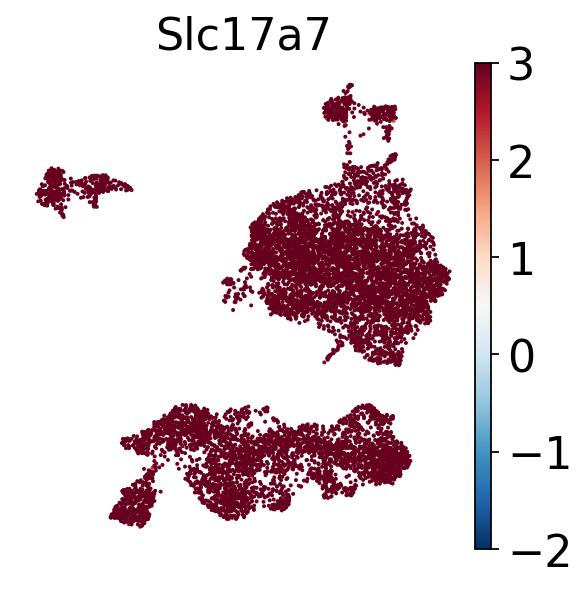

In [395]:
sc.pl.umap(bdata, color=["Slc17a7"
                       ],
           use_raw=False,ncols=3,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data',save=' slc17a7.pdf')#

In [98]:
# extract layer_v1 colors
bdata.uns['layer_v1_colors']

['#1f77b4', '#8c564b', '#17becf']

In [112]:
# find DEGs of leiden cluster
sc.tl.rank_genes_groups(bdata, 'leiden', method='wilcoxon',layer='norm_data',use_raw=False,n_genes=200)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


In [113]:
pd.options.display.max_columns = None
# display max_columns setting
pd.DataFrame(bdata.uns['rank_genes_groups']['names']).head(50)

,0,1,2,3,4,5,6,7,8
0,Pcp4,Ndn,Cnr1,Glra2,Rasl10a,Mef2c,Pex5l,Fkbp1a,Tshz2
1,3110035E14Rik,Ubb,Slc24a3,Rab3b,Tesc,Epha4,Pou3f1,Calb1,Lypd1
2,Trbc2,Hsp90aa1,Mef2c,Ddah1,C1ql3,Nrsn1,Rab3c,Nectin3,Cbln2
3,Garnl3,Slc25a3,Nrn1,Serpini1,Enc1,Hpca,Bcl11b,Gabra2,Etv1
4,Rprm,Itm2b,Syn1,Cd47,Galnt14,Camk2n2,Lamp5,Itpka,Il11ra1
5,Ttc9b,Tuba1a,Kcnq3,Gap43,Tsc22d1,Nr2f1,Ppfia2,Bhlhe22,Myl4
6,Tle4,Gapdh,6430548M08Rik,Basp1,Dgkb,Synpr,Ntng1,Cux2,Htr2c
7,Efhd2,Hsp90ab1,Nptxr,Ndn,Olfm1,Cux2,Gabra2,2900055J20Rik,Nrsn2
8,Ccdc12,Slc25a4,Rimbp2,Atp6ap2,Nptxr,Cpne4,Dner,Alcam,Neto2
9,Rnf152,Mdh1,Oxr1,Lmo3,Cck,Arpp21,Igfbp4,Pea15a,Nap1l5


# Check markers expression of each cluster

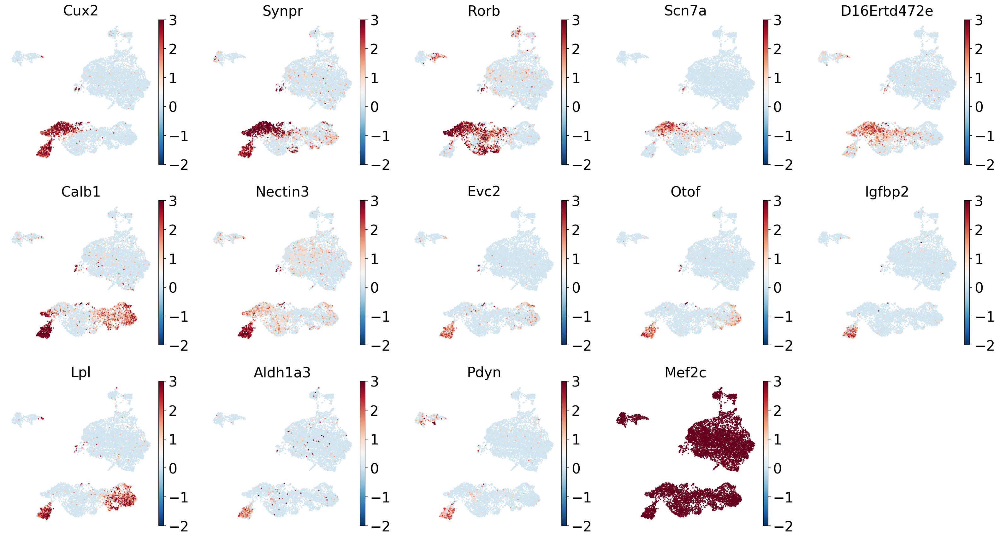

In [297]:
sc.pl.umap(bdata, color=["Cux2",'Synpr','Rorb','Scn7a','D16Ertd472e',#L2/3 c5
                         'Calb1','Nectin3','Evc2','Otof','Igfbp2','Lpl','Aldh1a3','Pdyn',#L2/3 c7
                         'Mef2c'],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

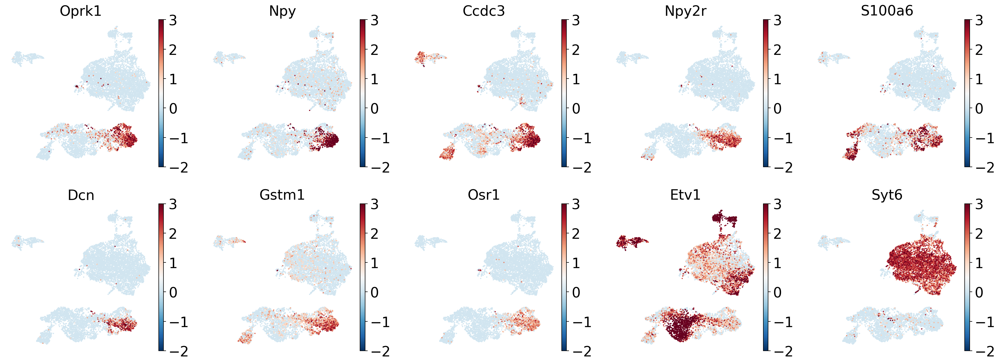

In [131]:
sc.pl.umap(bdata, color=['Oprk1','Npy','Ccdc3','Npy2r','S100a6','Dcn','Gstm1','Osr1',#L6, c4
                         ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

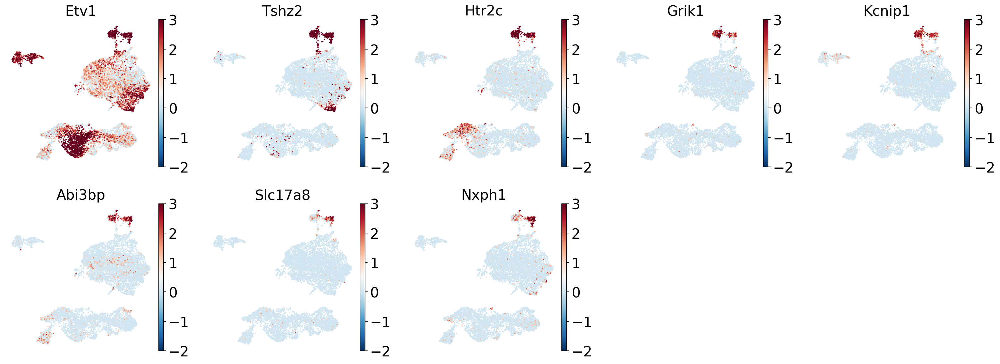

In [214]:
sc.pl.umap(bdata, color=['Etv1','Tshz2','Htr2c','Grik1','Kcnip1','Abi3bp','Slc17a8',"Nxph1"#L5, c8
                        ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

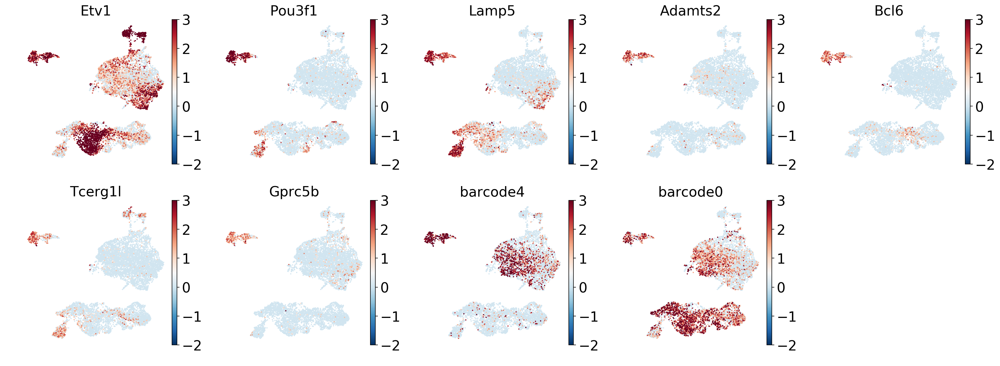

In [553]:
sc.pl.umap(bdata, color=['Etv1','Pou3f1','Lamp5','Adamts2','Bcl6','Tcerg1l','Gprc5b','barcode4','barcode0',#L5, c6
                        ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

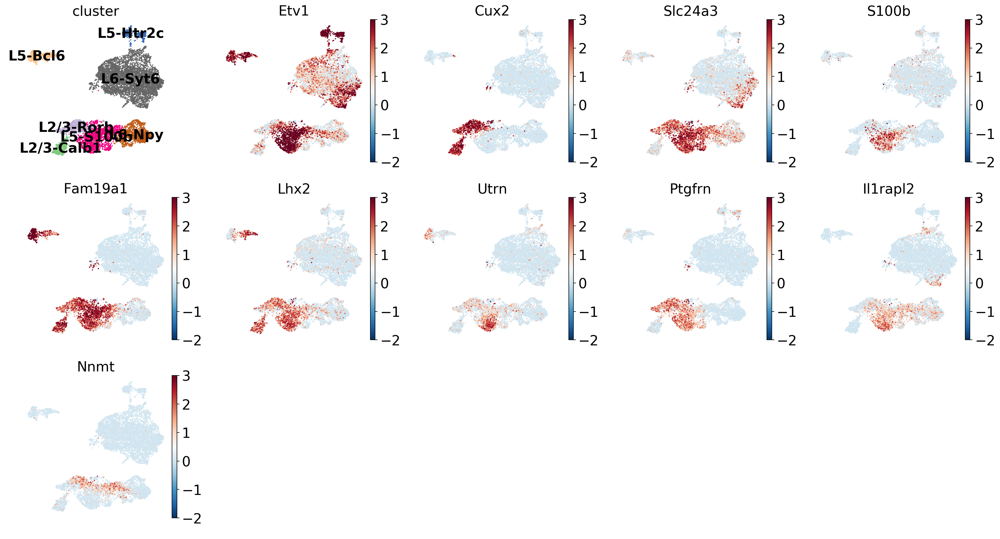

In [561]:
sc.pl.umap(bdata, color=['cluster','Etv1','Cux2',
                         'Slc24a3','S100b','Fam19a1','Lhx2','Utrn','Ptgfrn','Il1rapl2',
                         'Nnmt'#L5, c2
                        ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

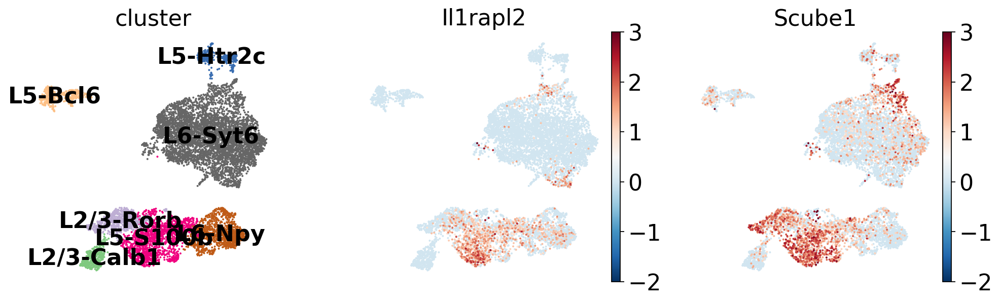

In [58]:
#rnascope candidate
sc.pl.umap(bdata, color=['cluster','Il1rapl2','Scube1'
                         ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

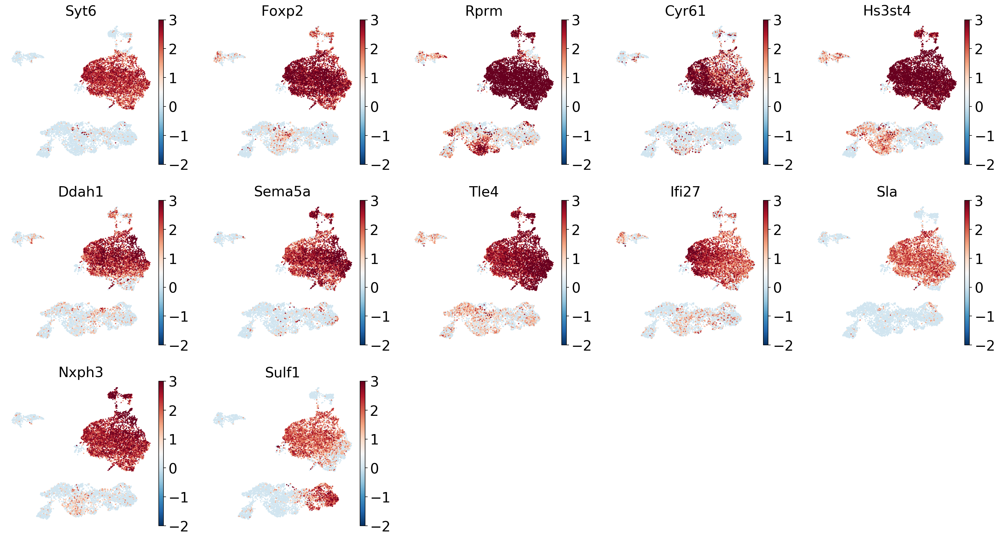

In [147]:
sc.pl.umap(bdata, color=['Syt6','Foxp2','Rprm','Cyr61','Hs3st4','Ddah1',#L6, c0 c1 c3
                         'Sema5a','Tle4','Ifi27','Sla','Nxph3','Sulf1'
                        ],
           use_raw=False,ncols=5,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data')

In [552]:
bdata.obs['layer_v1'].value_counts()

L6-Sulf1     6210
L5-Etv1      2112
L2/3-Cux2    1046
Name: layer_v1, dtype: int64

# Merge cluster, coarse clustering of subtype

In [99]:

bdata.obs['cluster'] = bdata.obs['leiden']
old_to_new = {'0':'L6-Syt6','1':'L6-Syt6','3':'L6-Syt6',
              '4': 'L6-Npy',
              '5':'L2/3-Rorb','7':'L2/3-Calb1',
              '2':'L5-S100b','6':'L5-Bcl6','8':'L5-Htr2c'}
    
bdata.obs['cluster'] = (
    bdata.obs['cluster']
    .map(old_to_new)
    .astype('category')
)

In [63]:
bdata

AnnData object with n_obs × n_vars = 9368 × 19394
    obs: 'ClusterID', 'ClusterName', 'G2M_Score', 'Phase', 'S_Score', 'facs', 'nCount_RNA', 'nFeature_RNA', 'old_ident', 'orig_ident', 'percent_mt', 'percent_rp', 'sample', 'leiden', 'layer', 'cluster', 'layer_v1', 'dpt_pseudotime'
    var: 'Selected', 'vst_mean', 'vst_variable', 'vst_variance', 'vst_variance_expected', 'vst_variance_standardized', 'highly_variable'
    uns: 'cluster_colors', 'dendrogram_leiden', 'diffmap_evals', 'facs_colors', 'iroot', 'layer_colors', 'layer_v1_colors', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'dendrogram_layer', 'dendrogram_cluster'
    obsm: 'X_diffmap', 'X_pca', 'X_tsne', 'X_umap', 'pca_cell_embeddings', 'tsne_cell_embeddings', 'umap_cell_embeddings'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'
    obsp: 'distances', 'connectivities'

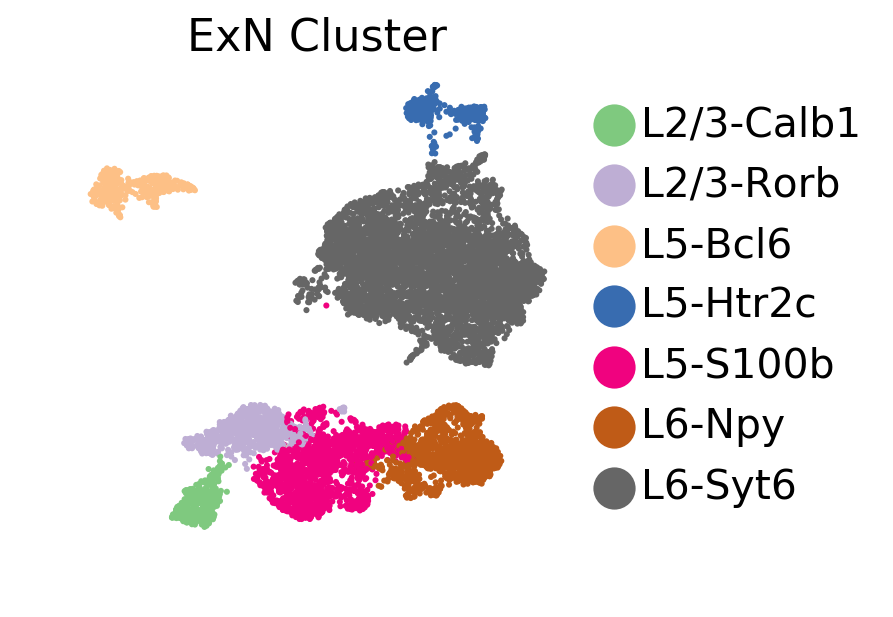

In [495]:
rcParams["legend.markerscale"] = 3.0
sc.pl.umap(bdata, color=['cluster'],use_raw=False,ncols=3,title='ExN Cluster',size=30,
           layer='norm_data',palette='Accent',legend_loc='right margin',save=' exn cluster.pdf')

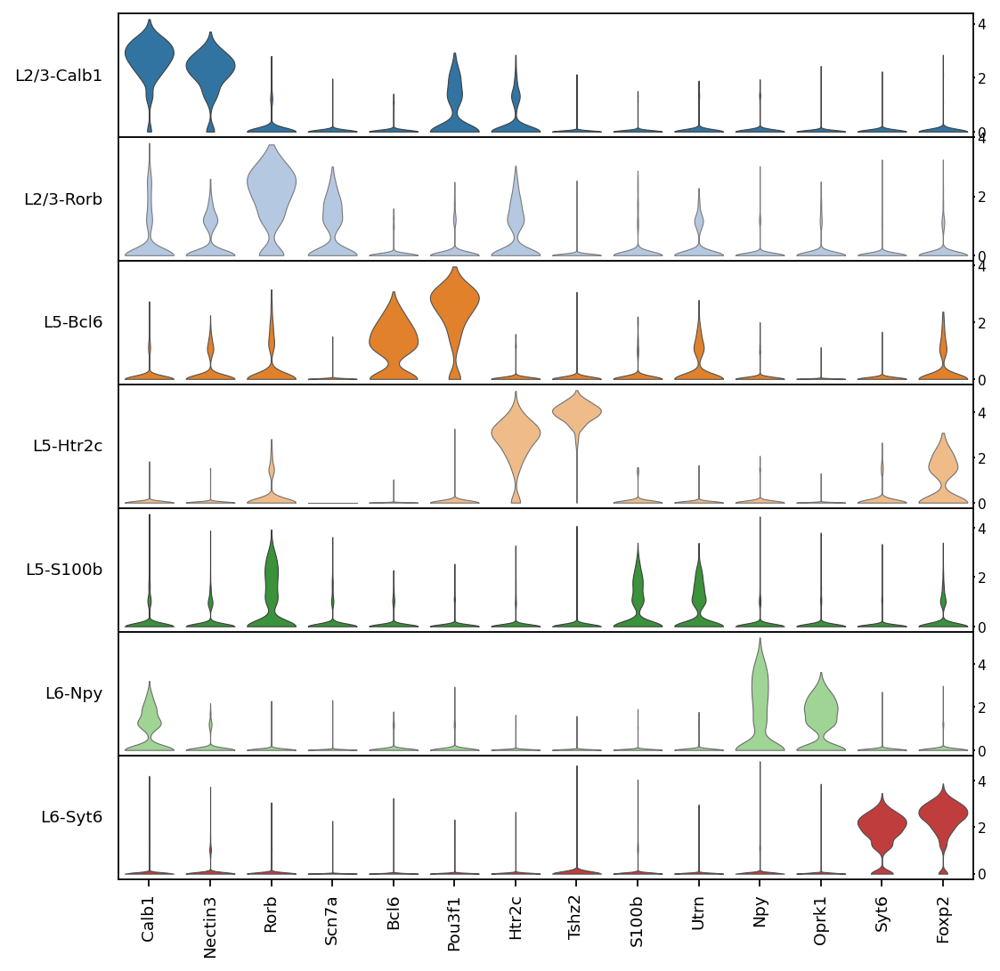

In [67]:
## violin plot of cell type markers
marker_genes=["Calb1",'Nectin3',
               'Rorb','Scn7a',
              'Bcl6','Pou3f1',
              'Htr2c','Tshz2',
            "S100b",'Utrn',
               "Npy",'Oprk1',
            'Syt6','Foxp2'
             ]
sc.pl.stacked_violin(bdata, marker_genes,layer='norm_data',
                          figsize=(8,8),row_palette=sc.pl.palettes.vega_20,
                     swap_axes=False,
                          groupby='cluster',
                     save=' exn cluster markers.pdf'
                    )

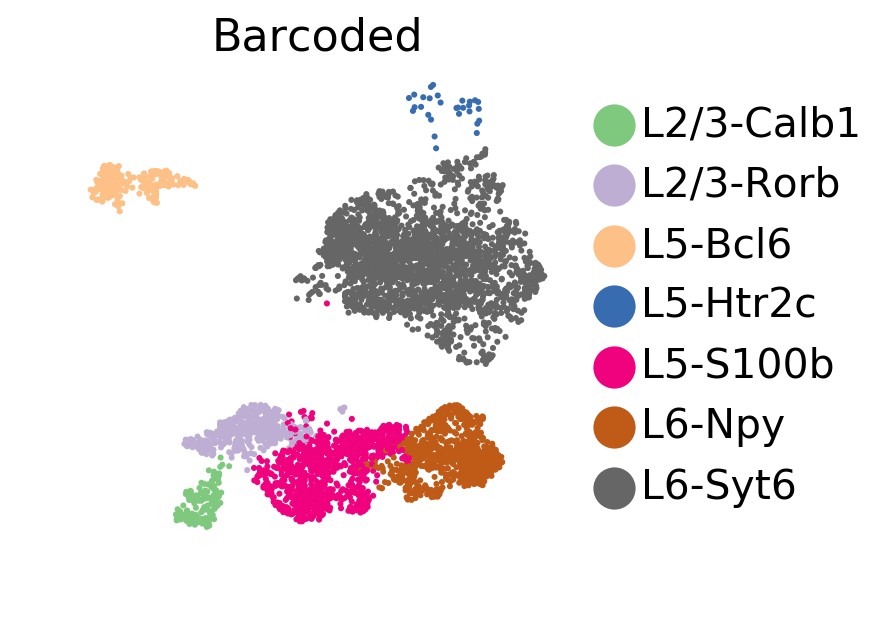

In [496]:
rcParams["legend.markerscale"] = 3.0
sc.pl.umap(ddata, color=['cluster'],use_raw=False,ncols=3,title='Barcoded',size=30,
           layer='norm_data',palette='Accent',legend_loc='right margin',save=' exn cluster barcoded.pdf')

/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 0 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 1 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 2 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 3 missing from current font.
  s, flags=LOAD_NO_SCALE | LOAD_NO_HINTING).horiAdvance
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/matplotlib/backends/backend_pdf.py:939: RuntimeWarning: Glyph 4 missing from current font.
  s, flags=LOAD_NO_SC

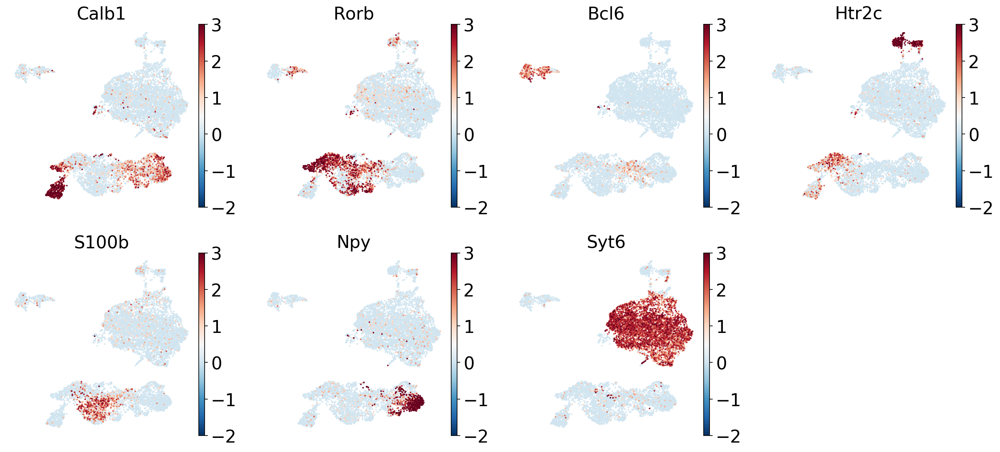

In [399]:
sc.pl.umap(bdata, color=["Calb1",'Rorb','Bcl6','Htr2c','S100b','Npy','Syt6'],
           use_raw=False,ncols=4,
           color_map='RdBu_r', vmin=-2, vmax=3,
           layer='norm_data',legend_loc='on data',save=' cluster marker genes.pdf')#

In [11]:
sc.tl.dendrogram(bdata,groupby='cluster')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster']`


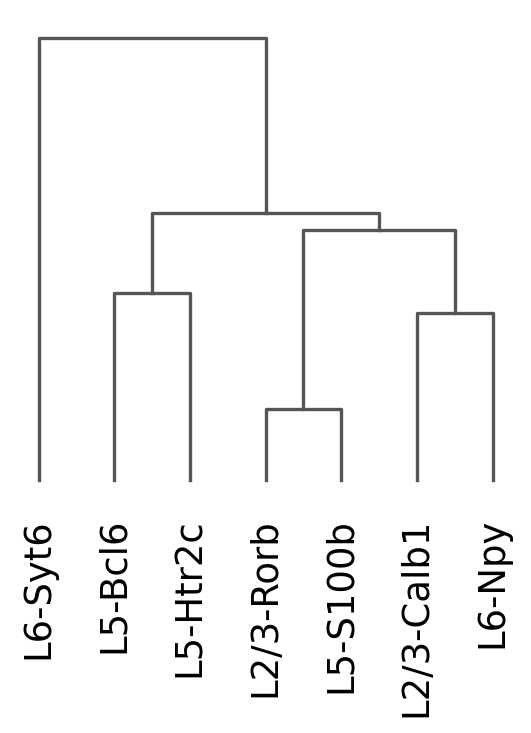

In [12]:
 sc.pl.dendrogram(bdata,groupby='cluster')

In [161]:
# export meta info
bdata.obs.to_csv('sub_exn_trim_meta.csv')

In [10]:
# extract cluster colors
bdata.uns['cluster_colors']

array(['#7fc97f', '#beaed4', '#fdc086', '#386cb0', '#f0027f', '#bf5b17',
       '#666666'], dtype=object)

In [9]:
# extract layer colors
bdata.uns['layer_v1_colors']

['#1f77b4', '#8c564b', '#17becf']

In [503]:
# extract cluster names
bdata.obs['cluster'].cat.categories

Index(['L2/3-Calb1', 'L2/3-Rorb', 'L5-Bcl6', 'L5-Htr2c', 'L5-S100b', 'L6-Npy',
       'L6-Syt6'],
      dtype='object')

In [210]:
# extract layer names
bdata.obs['layer_v1'].cat.categories

Index(['L2/3-Cux2', 'L5-Etv1', 'L6-Sulf1'], dtype='object')

In [602]:
# check points, save file
results_file = './write/pfc_sub_seu_trim_anno.h5ad'
bdata.write(results_file) 

In [7]:
bdata=sc.read_h5ad('./write/pfc_sub_seu_trim_anno.h5ad')

/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/home/xupb/anaconda3/envs/myenv/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,
